# AICV - STML final project

Used the dataset [Phising Email Dataset](https://www.kaggle.com/datasets/naserabdullahalam/phishing-email-dataset)

Naser Abdullah Alam. (2024). Phishing Email Dataset [Data set]. Kaggle. https://doi.org/10.34740/KAGGLE/DS/5074342

## Dataset details

for more depth in the data the datasets
- CEAS
- Nazario
- Nigerian Fraud
- SpamAssassin

were used

all these datasets contain the columns
| column   | description                                  | datatype |
|----------|----------------------------------------------|----------|
| sender   | sender's name and email adress                        | string   |
| receiver | receiver's email adress                       | string   |
| date     | date that the mail was sent                  | string   |
| subject  | subject of the mail                          | string   |
| body     | contents of the mail                         | string   |
| urls     | does the message contain urls                | bool     |
| label    | is the message a phising mail or is it legit | bool     |

- 29.11. presentation of the topic
- 13.12. final presentation

---
- contain section about ethics
- potential biases, problems,...

## Data analysis & preprocessing

In [15]:
# import the nessecary dependencies
import pandas as pd
import os
from datetime import datetime

In [16]:
# reading the csv file from the dataset folder
path = os.path.abspath(os.getcwd())

temp_array = []


for file in os.listdir(os.path.join(path,"dataset")):
    if file.endswith(".csv"):
        temp_data = pd.read_csv(os.path.join(path,"dataset",file), dtype={
            "sender":"str",
            "receiver":"str",
            "date":"str",
            "subject":"str",
            "body":"str",
            "urls":"bool",
            "label":"bool",
        })
        temp_data["dataset"]=file.replace(".csv","")
        temp_array.append(temp_data)
raw_data = pd.concat(temp_array, ignore_index=True)


# TODO: reformat the date column to datetime
print(raw_data.info(verbose=True))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49860 entries, 0 to 49859
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   sender    49529 non-null  object
 1   receiver  47768 non-null  object
 2   date      49377 non-null  object
 3   subject   49773 non-null  object
 4   body      49859 non-null  object
 5   label     49860 non-null  bool  
 6   urls      49860 non-null  bool  
 7   dataset   49860 non-null  object
dtypes: bool(2), object(6)
memory usage: 2.4+ MB
None


In [17]:
# remove unnessecary columns from the dataset
final_data = raw_data[["sender", "date", "subject", "body", "urls", "label","dataset"]]


# split up the sender into sender name and sender email adress
# strip the sender_name and the sender_email from artifacts
final_data["sender_name"] = final_data["sender"].str.extract(r"^(.*?)<").iloc[:, 0].str.strip()
final_data["sender_email"] = final_data["sender"].str.extract(r"<(.*?)>").iloc[:, 0]
# TODO: filter out the url from the content of the mail and add a flag that represents ssl in the url (is there https in the url?)
# remove the sender column that was split up
final_data.drop(columns=["sender"], inplace=True)
# remove null values from the column

final_data = final_data.dropna()

# rearrange the data columns
final_data = final_data[["sender_name", "sender_email", "date", "subject", "body", "label","urls","dataset"]]
y = final_data["label"]
final_data.drop("label", axis=1, inplace=True)

final_data["combined_data"] = final_data.apply(
    lambda row: f"[SENDER_NAME] {row['sender_name']} [SENDER_EMAIL] {row['sender_email']} [SUBJECT] {row['subject']} [BODY] {row['body']} [URLS]{row['urls']}",
    axis=1
)

# final_data.drop(["sender_name","sender_email","date","subject","body", "urls"], axis=1, inplace=True)

# print(final_data["combined_data"].head())


### Preprocessing
- split the dataset into training and test sets
- vectorize the dataset
-
- get the embeddings of the tokens

In [18]:
# use sklearn to split the dataset

from sklearn.model_selection import train_test_split

# create a train and test dataset consisting of 33% of the original dataset in the testset
X_train, X_test, y_train, y_test = train_test_split(final_data, y, test_size=0.33, random_state=42)

# Check the sizes of the splits
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)

print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (30312, 8)
y_train shape: (30312,)
X_test shape: (14930, 8)
y_test shape: (14930,)


### Vectorizing

remove all the stopwords

Using sklearn.TfidfVectorizer does an equivalent operation as:
> vectorize the data in the column subject and vectorize the data with a `CountVectorizer`

> Transform the data with a `TF-IDF Transformer` on the Counted data to weigh the occurences


In [19]:
import pandas as pd
import os
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from nltk.corpus import stopwords
import re
# download the stopwords package
import nltk
nltk.download("stopwords")

# Remove stop words from the raw text (before applying CountVectorizer)
# Get the stopwords list
stop_words = set(stopwords.words("english"))
stop_words.update(["re", "subject", "fw", "fwd", "sender_name", "sender_email", "subject", "body", "urlstrue", "urlsfalse"])  # Add other context-specific stopwords if needed

# Function to remove stop words from a text
def remove_stop_words(text):
    # Split text into words, remove stop words, and rejoin the remaining words
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    return ' '.join([word for word in text.split() if word not in stop_words])

# Apply the function to the 'subject' column and clean the text
X_train['cleaned_data'] = X_train['combined_data'].apply(remove_stop_words)
X_test['cleaned_data'] = X_test['combined_data'].apply(remove_stop_words)
vectorizer = TfidfVectorizer()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Flori\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [21]:
# define a new transformer for stopword removal
from sklearn.base import BaseEstimator, TransformerMixin
from nltk.corpus import stopwords

# download the stopwords package
import nltk
nltk.download("stopwords")

class RemoveStopWords(TransformerMixin, BaseEstimator):
    def __init__(self):
        self.language="english"
        self.stop_words = set(stopwords.words(self.language))
        self.stop_words.update(["re", "subject", "fw", "fwd", "sender_name", "sender_email", "subject", "body", "urlstrue", "urlsfalse"])  # Add other context-specific stopwords if needed

    def fit(self, X, y=None):
        return self

    def remove_stop_words(self, text):
        text = text.lower()
        text = re.sub(r'[^\w\s]', '', text)
        return ' '.join([word for word in text.split() if word not in stop_words])

    def transform(self, X):
            # Check if X is a list; apply remove_stop_words to each element
            if isinstance(X, list):
                return [self.remove_stop_words(text) for text in X]
            # If X is a pandas Series, use apply
            elif isinstance(X, pd.Series):
                return X.apply(self.remove_stop_words)
            else:
                raise ValueError("Input type not supported. Expected list or pandas Series.")


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Flori\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## Dataset Exploration

### Distribution of Dataset

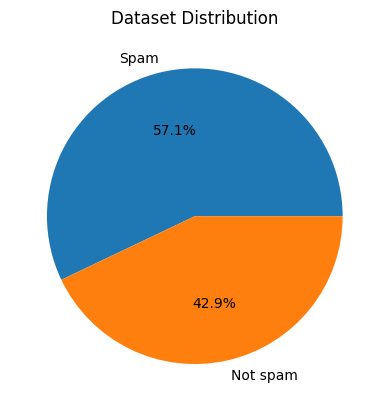

In [53]:
import matplotlib.pyplot as plt

# Count the frequency of each unique value in the 'label' column
data_satisfaction = raw_data["label"].value_counts()

# Map the unique values to labels for the pie chart
labels_satisfaction = ["Spam" if label else "Not spam" for label in data_satisfaction.index]

# Create a pie chart to visualize the data distribution
plt.pie(data_satisfaction, labels=labels_satisfaction, autopct="%1.1f%%")

# Display the pie chart
plt.title("Dataset Distribution")
plt.savefig("dataset_distribution.png",dpi=300)
plt.show()


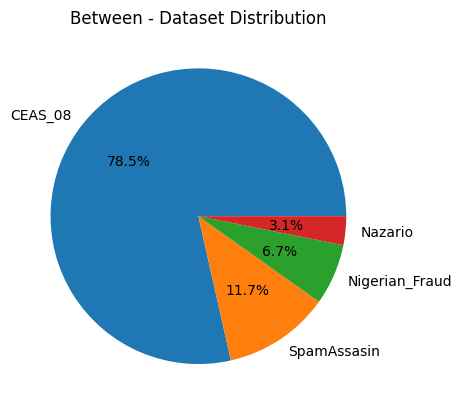

In [54]:
# Count the frequency of each unique value in the 'label' column
data_satisfaction = raw_data["dataset"].value_counts()

# Map the unique values to labels for the pie chart
labels_satisfaction = raw_data["dataset"].value_counts().index

# Create a pie chart to visualize the data distribution
plt.pie(data_satisfaction, labels=labels_satisfaction, autopct="%1.1f%%")

# Display the pie chart
plt.title("Between - Dataset Distribution")
plt.savefig("between_dataset_distribution.png",dpi=300)
plt.show()

### Wordcloud of Datasets

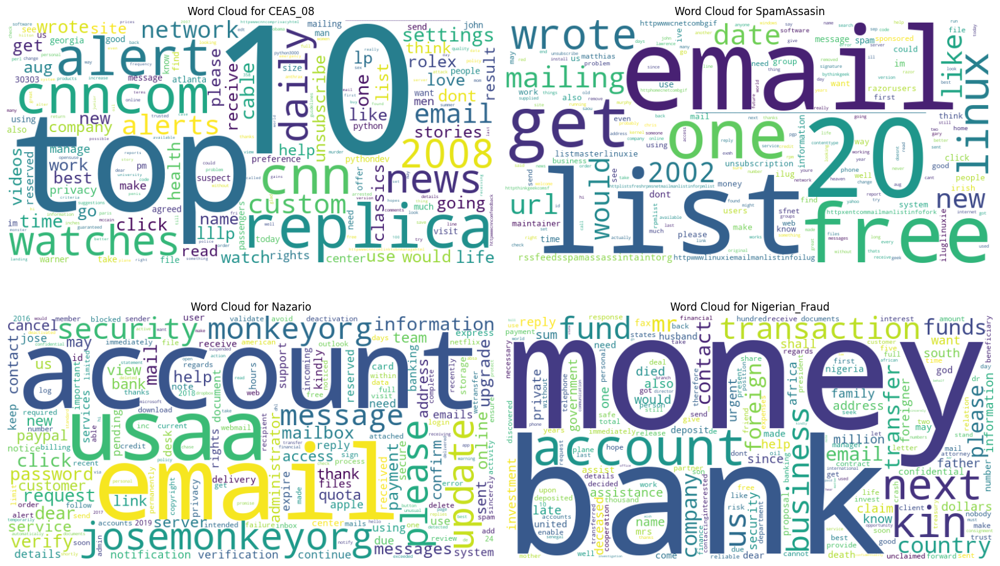

In [30]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer

# Assuming X_train is a DataFrame and 'dataset' and 'cleaned_data' columns exist
# Find unique categories in the 'dataset' column
categories = X_train['dataset'].unique().tolist()

# Generate TF-IDF vectorizer
vectorizer = TfidfVectorizer()

fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

for i, category in enumerate(categories):
    # Filter data for the current category
    filtered_data = X_train[X_train['dataset'] == category]
    
    # Fit and transform the TF-IDF matrix
    X_train_tfidf = vectorizer.fit_transform(filtered_data["cleaned_data"])

    # Create a word-to-score dictionary
    feature_names = vectorizer.get_feature_names_out()
    tfidf_scores = X_train_tfidf.sum(axis=0).A1  # Summing scores for each word
    tfidf_dict = dict(zip(feature_names, tfidf_scores))

    # Generate the TF-IDF-based Word Cloud
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(tfidf_dict)

    # Display the word cloud
    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Word Cloud for {category}")

plt.tight_layout()
plt.savefig("wordcloud.png", dpi=300)
plt.show()

## Modelling

### Multinomial Naive Bayes Model

#### Create a pipeline with the model

In [22]:
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
spam_clf = Pipeline([
    ("sw", RemoveStopWords()),
    ("vect", TfidfVectorizer()),
    ("clf", MultinomialNB())
])

spam_clf.fit(X_train["combined_data"], y_train)

Pipeline(steps=[('sw', RemoveStopWords()), ('vect', TfidfVectorizer()),
                ('clf', MultinomialNB())])

### Multi Layer Perceptron

In [26]:
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.feature_extraction.text import TfidfVectorizer
spam_mlp = Pipeline([
    ("sw", RemoveStopWords()),
    ("vect", TfidfVectorizer()),
    ("clf", MLPClassifier(verbose=True))
])

spam_mlp.fit(X_train["combined_data"], y_train)


Iteration 1, loss = 0.23975362
Iteration 2, loss = 0.03149064
Iteration 3, loss = 0.01221776
Iteration 4, loss = 0.00691651
Iteration 5, loss = 0.00488610
Iteration 6, loss = 0.00389163
Iteration 7, loss = 0.00332503
Iteration 8, loss = 0.00295720
Iteration 9, loss = 0.00269900
Iteration 10, loss = 0.00250631
Iteration 11, loss = 0.00237038
Iteration 12, loss = 0.00222356
Iteration 13, loss = 0.00211477
Iteration 14, loss = 0.00201729
Iteration 15, loss = 0.00193000
Iteration 16, loss = 0.00185020
Iteration 17, loss = 0.00177791
Iteration 18, loss = 0.00173664
Iteration 19, loss = 0.00164595
Iteration 20, loss = 0.00159046
Iteration 21, loss = 0.00154652
Iteration 22, loss = 0.00147602
Iteration 23, loss = 0.00143063
Iteration 24, loss = 0.00137627
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


Pipeline(steps=[('sw', RemoveStopWords()), ('vect', TfidfVectorizer()),
                ('clf', MLPClassifier(verbose=True))])

#### save and load model

In [27]:
from pickle import dump
with open("model2.pkl", "wb") as f:
    dump(spam_mlp, f, protocol=5)

In [15]:
from pickle import load
spam_mlp = ""
with open("model.pkl", "rb") as f:
    spam_mlp = load(f)

## Model evaluation

### Multinomial Naive Bayes Model

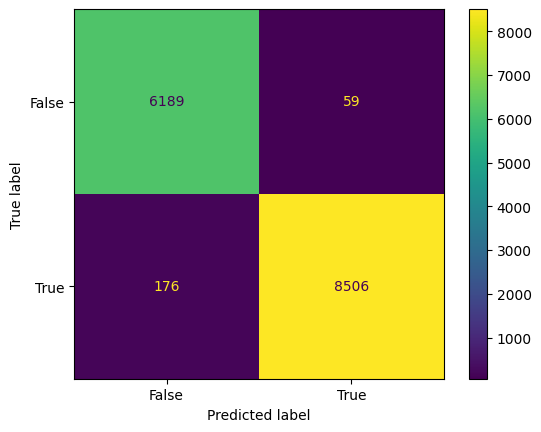

In [29]:
from sklearn import metrics

predicted = spam_clf.predict(X_test["combined_data"])

cm = metrics.confusion_matrix(y_test, predicted)

disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=spam_clf.classes_)
disp.plot()

In [52]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

y_pred = spam_clf.predict(X_test['combined_data'])

print("Accuracy: ", accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average='weighted'))
if len(set(y_test)) == 2:
    y_proba = spam_mlp.predict_proba(X_test['combined_data'])[:, 1]
    print("ROC-AUC Score: ", roc_auc_score(y_test, y_proba))

Accuracy:  0.9842598794373744
F1 Score:  0.9842794944228548
ROC-AUC Score:  0.9998178638541896


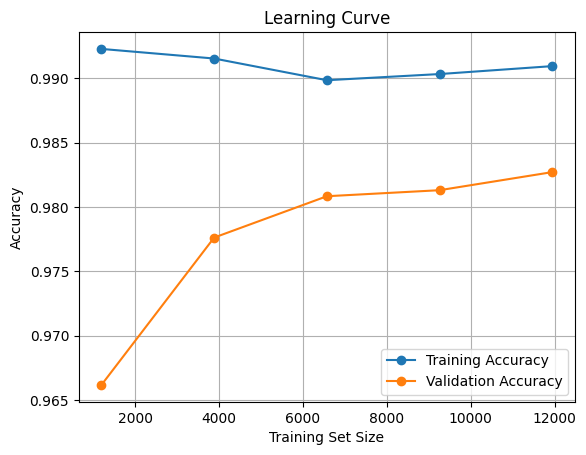

In [32]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(spam_clf, X_test["combined_data"], y_test, cv=5, scoring='accuracy')

# Calculate mean and standard deviation
train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

# Plot learning curve
plt.plot(train_sizes, train_mean, label="Training Accuracy", marker='o')
plt.plot(train_sizes, test_mean, label="Validation Accuracy", marker='o')
plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.savefig('learning_curve_nb.png', dpi=300)
plt.show()

### Multilayer Perceptron

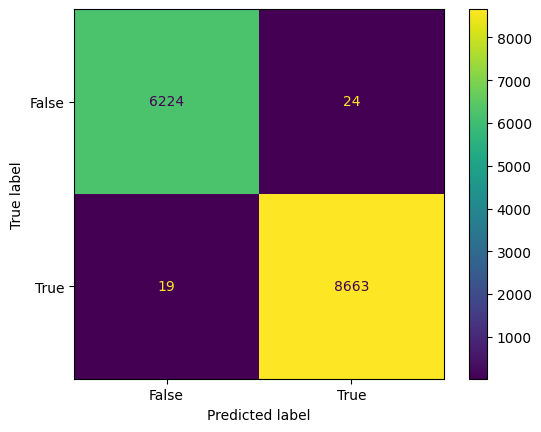

In [18]:
from sklearn import metrics

predicted = spam_mlp.predict(X_test["combined_data"])

cm = metrics.confusion_matrix(y_test, predicted)

disp = metrics.ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=spam_mlp.classes_)
disp.plot()

In [51]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

y_pred = spam_mlp.predict(X_test['combined_data'])

print("Accuracy: ", accuracy_score(y_test, y_pred))
print("F1 Score: ", f1_score(y_test, y_pred, average='weighted'))
if len(set(y_test)) == 2:
    y_proba = spam_mlp.predict_proba(X_test['combined_data'])[:, 1]
    print("ROC-AUC Score: ", roc_auc_score(y_test, y_proba))

Accuracy:  0.9954454119223041
F1 Score:  0.9954450017729417
ROC-AUC Score:  0.9998178638541896


Iteration 1, loss = 0.67379300
Iteration 2, loss = 0.60104097
Iteration 3, loss = 0.51786337
Iteration 4, loss = 0.43699509
Iteration 5, loss = 0.36223040
Iteration 6, loss = 0.29624736
Iteration 7, loss = 0.24031236
Iteration 8, loss = 0.19428468
Iteration 9, loss = 0.15743704
Iteration 10, loss = 0.12827967
Iteration 11, loss = 0.10541695
Iteration 12, loss = 0.08755936
Iteration 13, loss = 0.07365029
Iteration 14, loss = 0.06259955
Iteration 15, loss = 0.05381856
Iteration 16, loss = 0.04682734
Iteration 17, loss = 0.04102697
Iteration 18, loss = 0.03634981
Iteration 19, loss = 0.03242468
Iteration 20, loss = 0.02915636
Iteration 21, loss = 0.02635275
Iteration 22, loss = 0.02399349
Iteration 23, loss = 0.02188417
Iteration 24, loss = 0.02009427
Iteration 25, loss = 0.01857514
Iteration 26, loss = 0.01715099
Iteration 27, loss = 0.01596819
Iteration 28, loss = 0.01486632
Iteration 29, loss = 0.01389833
Iteration 30, loss = 0.01302889
Iteration 31, loss = 0.01224547
Iteration 32, los

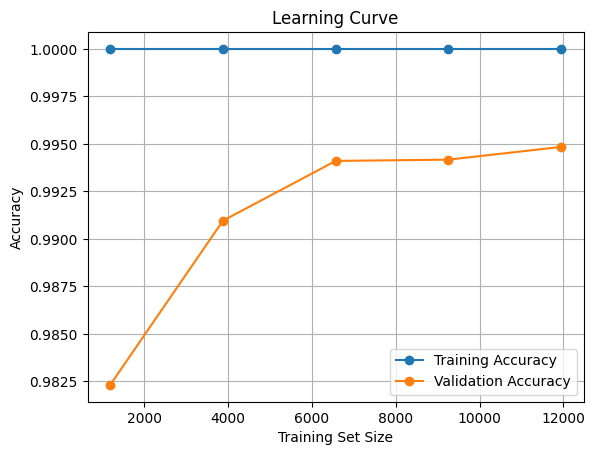

In [21]:
from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(spam_mlp, X_test["combined_data"], y_test, cv=5, scoring='accuracy')

# Calculate mean and standard deviation
train_mean = train_scores.mean(axis=1)
test_mean = test_scores.mean(axis=1)

# Plot learning curve
plt.plot(train_sizes, train_mean, label="Training Accuracy", marker='o')
plt.plot(train_sizes, test_mean, label="Validation Accuracy", marker='o')
plt.title("Learning Curve")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.savefig('learning_curve.png', dpi=300)
plt.show()


# Explainability of the model

In [25]:
from lime.lime_text import LimeTextExplainer
from random import randint

class_names = {
    True: "SPAM",
    False: "NO SPAM"
}

explainer = LimeTextExplainer(class_names=["NO SPAM","SPAM"])
randoms = [randint(0, X_test.shape[0]) for p in range(0, 5)]


# Explaining the instance
for idx in randoms:

    # Access the subject text
    text_instance = X_test.iloc[idx]["combined_data"]
    # print(f"Text instance: {text_instance}")
    exp = explainer.explain_instance(
        text_instance,
        lambda x: spam_clf.predict_proba(x),  # Ensure the classifier can handle raw text
        num_features=15
    )

    # Print the results
    print(f"Document id: {idx}")
    probabilities = spam_clf.predict_proba([text_instance])[0]
    print(f"Probability(spam) = {probabilities[0]}")
    print(f"Probability(no spam) = {probabilities[1]}")

    true_class_label = y_test.iloc[idx]
    print(f"True class: {class_names[true_class_label]}")

    exp.as_list()

    exp.show_in_notebook(text=True)

Document id: 10683
Probability(spam) = 5.586837545572227e-07
Probability(no spam) = 0.9999994413162481
True class: SPAM


Document id: 8439
Probability(spam) = 0.9998233667625993
Probability(no spam) = 0.00017663323740619403
True class: NO SPAM


Document id: 10031
Probability(spam) = 0.999257411983787
Probability(no spam) = 0.0007425880162189669
True class: NO SPAM


Document id: 2630
Probability(spam) = 0.9992576235167465
Probability(no spam) = 0.0007423764832564974
True class: NO SPAM


Document id: 13186
Probability(spam) = 0.008215911821848288
Probability(no spam) = 0.9917840881781516
True class: SPAM


In [47]:
from lime.lime_text import LimeTextExplainer
from random import randint

class_names = {
    True: "SPAM",
    False: "NO SPAM"
}

explainer = LimeTextExplainer(class_names=["NO SPAM","SPAM"])
randoms = [randint(0, X_test.shape[0]) for p in range(0, 5)]


# Explaining the instance
for idx in randoms:

    # Access the subject text
    text_instance = X_test.iloc[idx]["combined_data"]
    # print(f"Text instance: {text_instance}")
    exp = explainer.explain_instance(
        text_instance,
        lambda x: spam_mlp.predict_proba(x),  # Ensure the classifier can handle raw text
        num_features=15
    )

    # Print the results
    print(f"Document id: {idx}")
    probabilities = spam_mlp.predict_proba([text_instance])[0]
    print(f"Probability(spam) = {probabilities[0]}")
    print(f"Probability(no spam) = {probabilities[1]}")

    true_class_label = y_test.iloc[idx]
    print(f"True class: {class_names[true_class_label]}")

    exp.as_list()

    exp.show_in_notebook(text=True)

Document id: 4809
Probability(spam) = 9.225623442088438e-05
Probability(no spam) = 0.9999077437655791
True class: SPAM


Document id: 6168
Probability(spam) = 7.1738198631488e-06
Probability(no spam) = 0.9999928261801369
True class: SPAM


Document id: 5720
Probability(spam) = 0.9999609076021687
Probability(no spam) = 3.909239783128382e-05
True class: NO SPAM


Document id: 2816
Probability(spam) = 0.9999088053346077
Probability(no spam) = 9.119466539234179e-05
True class: NO SPAM


Document id: 14393
Probability(spam) = 0.9998880378498741
Probability(no spam) = 0.00011196215012585407
True class: NO SPAM


# Real world example

In [45]:
# create a function that will read .msg files and return an object of the message
import extract_msg
import os

msg = extract_msg.openMsg(os.path.join(os.path.abspath(os.getcwd()),"dataset","testmails","2.msg"))
sender = msg.sender.split("<")[0].replace(" ","")
sender_email = msg.sender.split("<")[1].replace(">","")

string = f"[SENDER_NAME] {sender} [SENDER_EMAIL] {sender_email} [SUBJECT] {msg.subject} [BODY] {msg.body} [URLS]{'TRUE'}"

exp = explainer.explain_instance(
        string,
        lambda x: spam_mlp.predict_proba(list(x)),
        num_features=15
    )
exp.as_list()

exp.show_in_notebook(text=True)


